# Data to Postgres

In [2]:
import pandas as pd
import numpy as np
from sqlalchemy import create_engine
from datetime import datetime
import os
#from unidecode import unidecode

In [2]:
driver = 'postgres'
username = 'ds4a'
password = 'ds4A-7eaM79'
host = 'ds4a.cm1dcdf7pnnv.us-east-2.rds.amazonaws.com'
port = 5432
database = 'team_79'

connection_string = f'{driver}://{username}@{host}:{port}/{database}'
engine = create_engine(connection_string, encoding='utf-8')

## Data Amenazas

In [3]:
filenames = ['amenazasunido.csv']#,'del_sexualesUNI.csv']
all_dfs = []

for file in filenames:
    temp = pd.read_csv(file, encoding= 'utf8')
    
    # Eliminar acentos en el nombre de las columnas
    temp.columns = [(str(col)) for col in temp.columns]

    # Reemplazar espacios por _
    temp.columns = temp.columns.str.replace(' ', '_')
    
    # Strip
    temp.columns = temp.columns.str.strip()

    # A minúsculas
    temp.columns = temp.columns.str.lower()

    # Reemplazar - por nans
    #temp.replace('-', np.nan, inplace=True)

    # Set axis name
    temp.rename_axis('id', inplace=True)
    
    all_dfs.append(temp)

C:\Users\Admin\AppData\Local\Continuum\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3063: DtypeWarning: Columns (18) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [166]:
temp

,fecha,departamento_,municipio,dia,hora,barrio,zona,clase_de_sitio,arma_empleada,movil_agresor,movil_victima,edad,sexo,estado_civil,pais_de_nacimiento,clase_de_empleado,profesion,escolaridad,codigo_dane,Cantidad
id,,,,,,,,,,,,,,,,,,,,
0,01/01/2010,ANTIOQUIA,MEDELLÍN (CT),Viernes,01:00,GRANIZAL C-1,RURAL,CASAS DE HABITACION,NO REPORTADO,NO REPORTADO,NO REPORTADO,48,MASCULINO,SOLTERO,COLOMBIA,INDEPENDIENTE,NO REPORTADO,SECUNDARIA,5001000,1
1,01/01/2010,ANTIOQUIA,MEDELLÍN (CT),Viernes,12:00,EL RINCON C-16,URBANA,CASAS DE HABITACION,ARMA BLANCA,A PIE,A PIE,27,MASCULINO,SEPARADO,COLOMBIA,INDEPENDIENTE,NO REPORTADA,SECUNDARIA,5001000,1
2,01/01/2010,ARAUCA,TAME,Viernes,03:30,SUCRE,URBANA,VIAS PUBLICAS,NO REPORTADO,CONDUCTOR MOTOCICLETA,CONDUCTOR MOTOCICLETA,25,MASCULINO,SOLTERO,COLOMBIA,EMPLEADO PARTICULAR,NO REPORTADO,SUPERIOR,81794000,1
3,01/01/2010,ARAUCA,TAME,Viernes,06:30,CENTRO,URBANA,VIAS PUBLICAS,NO REPORTADO,A PIE,A PIE,37,FEMENINO,UNION LIBRE,COLOMBIA,AMA DE CASA,NO REPORTADO,SECUNDARIA,81794000,1
4,01/01/2010,ATLÁNTICO,BARRANQUILLA (CT),Viernes,16:30,LAS MERCEDES,URBANA,DENTRO DE LA VIVIENDA,NO REPORTADO,A PIE,A PIE,31,FEMENINO,CASADO,COLOMBIA,INDEPENDIENTE,FISIOTERAPEUTA,SUPERIOR,8001000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
289959,31/12/2019,SUCRE,SINCELEJO (CT),Martes,0:00:00,LA UNION,URBANA,OTRO,NO REPORTADO,A PIE,A PIE,-,MASCULINO,SOLTERO,-,EMPLEADO PARTICULAR,NO REPORTADA,NO REPORTADO,70001000,1
289960,31/12/2019,SUCRE,SINCELEJO (CT),Martes,20:36:00,LA UNION,URBANA,VIAS PUBLICAS,NO REPORTADO,A PIE,A PIE,34,MASCULINO,SOLTERO,-,EMPLEADO PARTICULAR,NO REPORTADA,SUPERIOR,70001000,1
289961,31/12/2019,TOLIMA,IBAGUÉ (CT),Martes,19:45:00,BALTAZAR,URBANA,VIAS PUBLICAS,NO REPORTADO,A PIE,A PIE,38,MASCULINO,SOLTERO,-,EMPLEADO PARTICULAR,NO REPORTADA,SECUNDARIA,73001000,1


In [17]:
#all_dfs[0]['barrio'].fillna('Sin info',inplace=True)

all_dfs[0]#[all_dfs[0]['barrio'].isna()]
# pd.concat(all_dfs, axis=0).columns.to_list()

,fecha,departamento_,municipio,dia,hora,barrio,zona,clase_sitio,arma_empleada,movil_agresor,movil_victima,edad,sexo,estado_civil,pais_nace,clase_empleado,profesion,escolaridad,codigo_dane,2010
id,,,,,,,,,,,,,,,,,,,,
0,01/01/2010,ANTIOQUIA,MEDELLÍN (CT),Viernes,01:00,GRANIZAL C-1,RURAL,CASAS DE HABITACION,NO REPORTADO,NO REPORTADO,NO REPORTADO,48,MASCULINO,SOLTERO,COLOMBIA,INDEPENDIENTE,NO REPORTADO,SECUNDARIA,5001000,1
1,01/01/2010,ANTIOQUIA,MEDELLÍN (CT),Viernes,12:00,EL RINCON C-16,URBANA,CASAS DE HABITACION,ARMA BLANCA,A PIE,A PIE,27,MASCULINO,SEPARADO,COLOMBIA,INDEPENDIENTE,NO REPORTADA,SECUNDARIA,5001000,1
2,01/01/2010,ARAUCA,TAME,Viernes,03:30,SUCRE,URBANA,VIAS PUBLICAS,NO REPORTADO,CONDUCTOR MOTOCICLETA,CONDUCTOR MOTOCICLETA,25,MASCULINO,SOLTERO,COLOMBIA,EMPLEADO PARTICULAR,NO REPORTADO,SUPERIOR,81794000,1
3,01/01/2010,ARAUCA,TAME,Viernes,06:30,CENTRO,URBANA,VIAS PUBLICAS,NO REPORTADO,A PIE,A PIE,37,FEMENINO,UNION LIBRE,COLOMBIA,AMA DE CASA,NO REPORTADO,SECUNDARIA,81794000,1
4,01/01/2010,ATLÁNTICO,BARRANQUILLA (CT),Viernes,16:30,LAS MERCEDES,URBANA,DENTRO DE LA VIVIENDA,NO REPORTADO,A PIE,A PIE,31,FEMENINO,CASADO,COLOMBIA,INDEPENDIENTE,FISIOTERAPEUTA,SUPERIOR,8001000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
289959,31/12/2019,SUCRE,SINCELEJO (CT),Martes,0:00:00,LA UNION,URBANA,OTRO,NO REPORTADO,A PIE,A PIE,-,MASCULINO,SOLTERO,-,EMPLEADO PARTICULAR,NO REPORTADA,NO REPORTADO,70001000,1
289960,31/12/2019,SUCRE,SINCELEJO (CT),Martes,20:36:00,LA UNION,URBANA,VIAS PUBLICAS,NO REPORTADO,A PIE,A PIE,34,MASCULINO,SOLTERO,-,EMPLEADO PARTICULAR,NO REPORTADA,SUPERIOR,70001000,1
289961,31/12/2019,TOLIMA,IBAGUÉ (CT),Martes,19:45:00,BALTAZAR,URBANA,VIAS PUBLICAS,NO REPORTADO,A PIE,A PIE,38,MASCULINO,SOLTERO,-,EMPLEADO PARTICULAR,NO REPORTADA,SECUNDARIA,73001000,1


In [19]:
renaming={
    'clase_sitio':'clase_de_sitio',
    'pais_nace':'pais_de_nacimiento',
    'clase_empleado':'clase_de_empleado',
    "2010":"Cantidad"
}

for i in range(len(all_dfs)):
    all_dfs[i].rename(columns=renaming, inplace=True)
    
df_f = pd.concat(all_dfs, axis=0)
#df_f.drop(columns=['2012'], inplace=True)

In [77]:
all_dfs

[             fecha departamento_          municipio      dia      hora  \
 id                                                                       
 0       01/01/2010     ANTIOQUIA      MEDELLÍN (CT)  Viernes     01:00   
 1       01/01/2010     ANTIOQUIA      MEDELLÍN (CT)  Viernes     12:00   
 2       01/01/2010        ARAUCA               TAME  Viernes     03:30   
 3       01/01/2010        ARAUCA               TAME  Viernes     06:30   
 4       01/01/2010     ATLÁNTICO  BARRANQUILLA (CT)  Viernes     16:30   
 ...            ...           ...                ...      ...       ...   
 289959  31/12/2019         SUCRE     SINCELEJO (CT)   Martes   0:00:00   
 289960  31/12/2019         SUCRE     SINCELEJO (CT)   Martes  20:36:00   
 289961  31/12/2019        TOLIMA        IBAGUÉ (CT)   Martes  19:45:00   
 289962  31/12/2019         VALLE          CALI (CT)   Martes   8:30:00   
 289963  31/12/2019         VALLE         CANDELARIA   Martes  15:00:00   
 
                       

In [28]:
df_f.edad.unique()
#df_f.edad.sort_values().unique()
#df_f.edad.replace('NO REPORTADO', 'NO REPORTADA', inplace=True)
#df_f.edad = df_f.edad.astype(float)

array(['48', '27', '25', '37', '31', '33', '36', '35', '26', '19', '50',
       '43', '23', '62', 'NO REPORTADA', '40', '28', '30', '69', '22',
       '53', '20', '54', '58', '49', '38', '59', '41', '24', '21', '47',
       '18', '64', '45', '44', '34', '32', '42', '46', '29', '66', '55',
       '56', '57', '39', '61', '17', '15', '16', '52', '60', '51', '67',
       '77', '68', '12', '14', '74', '72', '13', '65', '63', '11', '75',
       '73', '10', '81', '70', '80', '71', '7', '76', '82', '6', '9',
       '78', '5', '2', '88', '84', '0', '8', '89', '1', '4', '83', '79',
       '86', '3', '92', '90', '-', '85', '91', '87', '-1', '94', '96',
       '95'], dtype=object)

In [29]:
df_f.municipio.replace(' \(CT\)', '', regex=True, inplace=True)

In [32]:
for col in df_f.columns:
    print(col,"\n",df_f[col].unique())

fecha 
 ['01/01/2010' '02/01/2010' '03/01/2010' ... '29/12/2019' '30/12/2019'
 '31/12/2019']
departamento_ 
 ['ANTIOQUIA' 'ARAUCA' 'ATLÁNTICO' 'BOLÍVAR' 'BOYACÁ' 'CALDAS' 'CESAR'
 'CUNDINAMARCA' 'HUILA' 'MAGDALENA' 'META' 'NARIÑO' 'NORTE DE SANTANDER'
 'PUTUMAYO' 'QUINDÍO' 'RISARALDA' 'SANTANDER' 'SUCRE' 'TOLIMA' 'VALLE'
 'VICHADA' 'CHOCÓ' 'GUAJIRA' 'AMAZONAS' 'CAQUETÁ' 'CÓRDOBA' 'CASANARE'
 'CAUCA' 'GUAVIARE' 'VAUPÉS' 'GUAINÍA' 'SAN ANDRÉS']
municipio 
 ['MEDELLÍN' 'TAME' 'BARRANQUILLA' ... 'SAN JOSÉ DE LA MONTAÑA' 'CARAMANTA'
 'BITUIMA']
dia 
 ['Viernes' 'Sábado' 'Domingo' 'Lunes' 'Martes' 'Miércoles' 'Jueves']
hora 
 ['01:00' '12:00' '03:30' ... '4:36:00' '5:34:00' '3:52:00']
barrio 
 ['GRANIZAL C-1' 'EL RINCON C-16' 'SUCRE' ... 'LA GUACA E-16'
 'EL PLAYON E-18' 'MARIA AUXILIADORA I  y II (23-S-2-1)']
zona 
 ['RURAL' 'URBANA' 'OTRAS']
clase_de_sitio 
 ['CASAS DE HABITACION' 'VIAS PUBLICAS' 'DENTRO DE LA VIVIENDA'
 'NO DEFINIDO' 'CARCELES' 'TIENDA' 'LOCAL COMERCIAL'
 'SOBRE ANDEN - V

escolaridad 
 ['SECUNDARIA' 'SUPERIOR' 'TECNOLOGO' 'PRIMARIA' 'NO REPORTADO' 'TECNICO'
 'ANALFABETA' '-' 'NO REPORTADA']
codigo_dane 
 [5001000 81794000 8001000 ... 5206000 5658000 25095000]
Cantidad 
 [ 1  2  3  4  7  5  6  8 10 11  9 12 15 13 19 14 20 25 23 21 22 27 16 17]


In [33]:
df_f.escolaridad.replace('-', 'NO REPORTADA', inplace=True)

In [39]:
df_f.sexo.replace(['-','NO REPORTA','NO REPORTADO'], 'NO REPORTADA', inplace=True)

In [41]:
df_f.sexo.unique()

array(['MASCULINO', 'FEMENINO', 'NO REPORTADA'], dtype=object)

In [9]:
# df_f.to_sql(con=engine, name='lesiones_accidentes_transito_2', if_exists='replace')

# EDA

In [34]:
df_f.columns

Index(['fecha', 'departamento_', 'municipio', 'dia', 'hora', 'barrio', 'zona',
       'clase_de_sitio', 'arma_empleada', 'movil_agresor', 'movil_victima',
       'edad', 'sexo', 'estado_civil', 'pais_de_nacimiento',
       'clase_de_empleado', 'profesion', 'escolaridad', 'codigo_dane',
       'Cantidad'],
      dtype='object')

In [35]:
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.rcParams['axes.labelsize'] = 14
mpl.rcParams['xtick.labelsize'] = 12
#mpl.rcParams.keys()

sns.set_palette('Accent')

In [3]:
aa=df_f.groupby('fecha').apply(lambda df: df.sexo.value_counts()).reset_index()

NameError: name 'df_f' is not defined

In [2]:
aa

NameError: name 'aa' is not defined

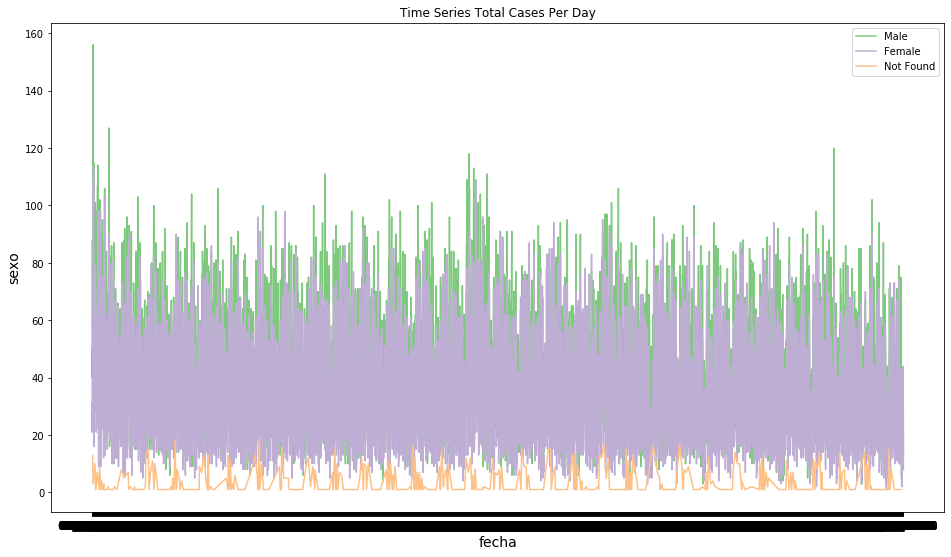

In [44]:
plt.figure(figsize=(16,9))
ax = sns.lineplot(
    data=aa,
    x='fecha',
    y='sexo',
    hue='level_1'
)

ax.set_title('Time Series Total Cases Per Day');
ax.legend(['Male', 'Female', 'Not Found']);

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31]),
 <a list of 32 Text xticklabel objects>)

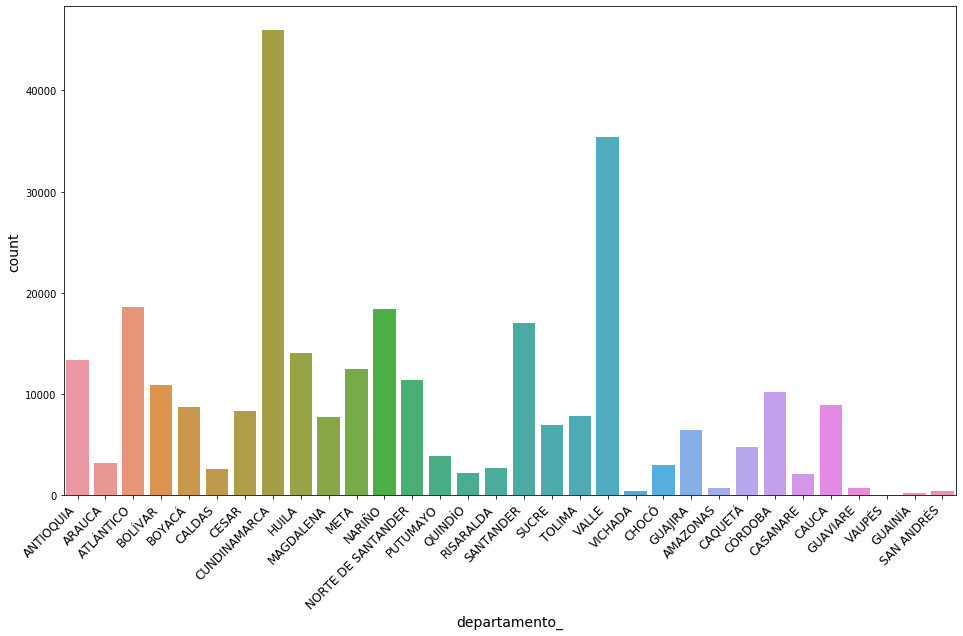

In [49]:
plt.figure(figsize=(16,9))
ax = sns.countplot(
    data=df_f,
    x='departamento_'
)

plt.xticks(rotation=45,ha='right')

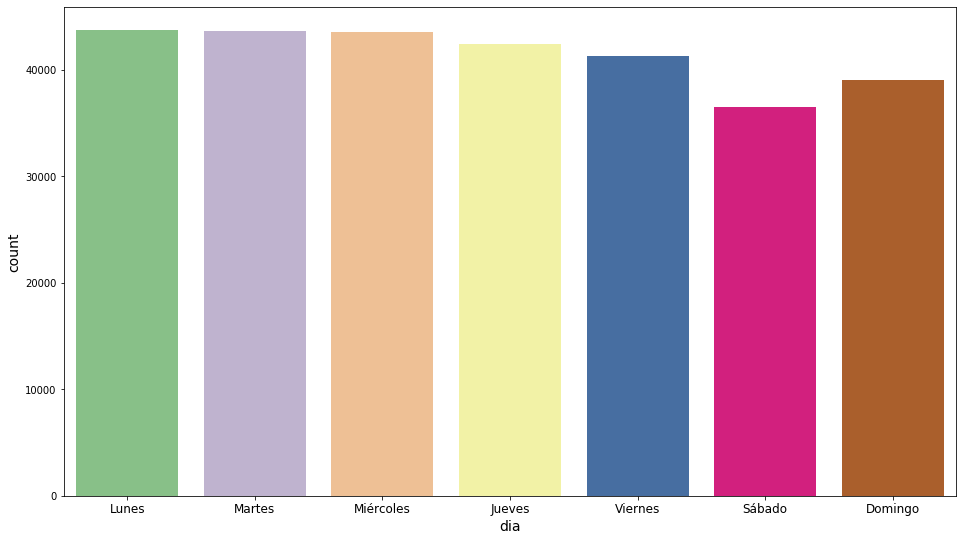

In [50]:
plt.figure(figsize=(16,9))

order = ['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo']
ax = sns.countplot(
    data=df_f,
    x='dia',
    order=order
)


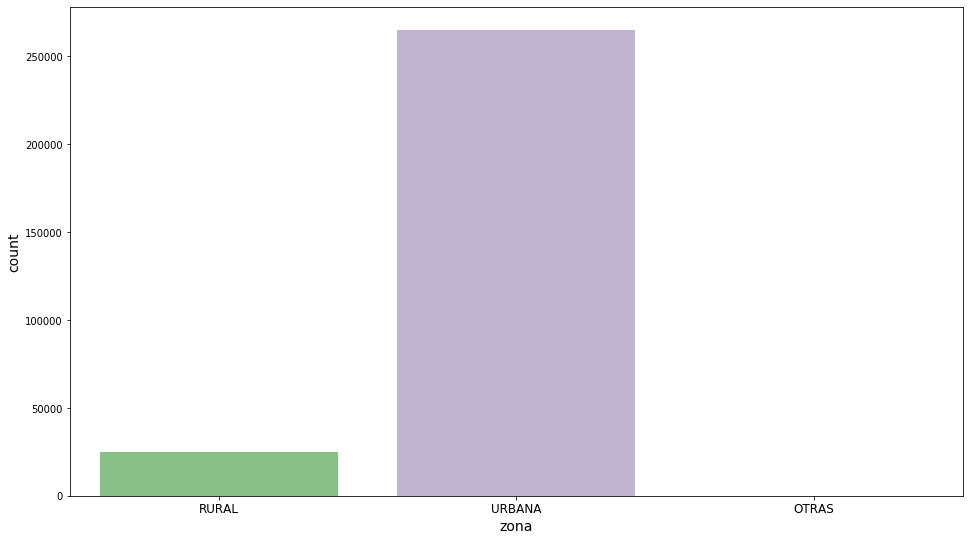

In [51]:
plt.figure(figsize=(16,9))
ax = sns.countplot(
    data=df_f,
    x='zona',
)

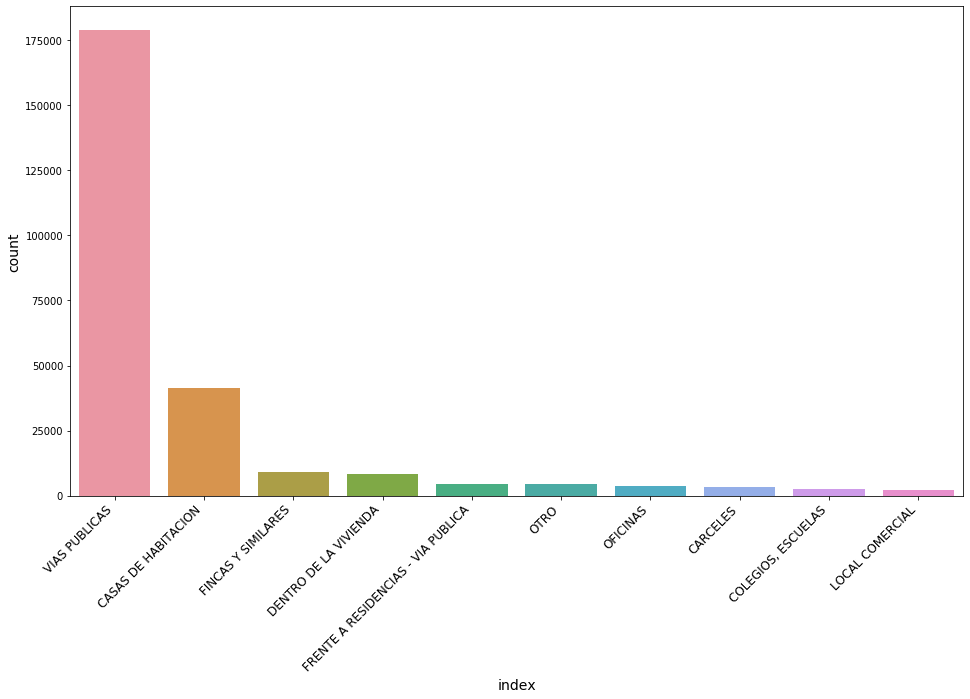

In [56]:
plt.figure(figsize=(16,9))

sns.barplot(
    data=df_f.clase_de_sitio.value_counts().head(10).to_frame(name='count').reset_index(),
    x='index',
    y='count'
) 

plt.xticks(rotation=45, ha='right')
plt.show()

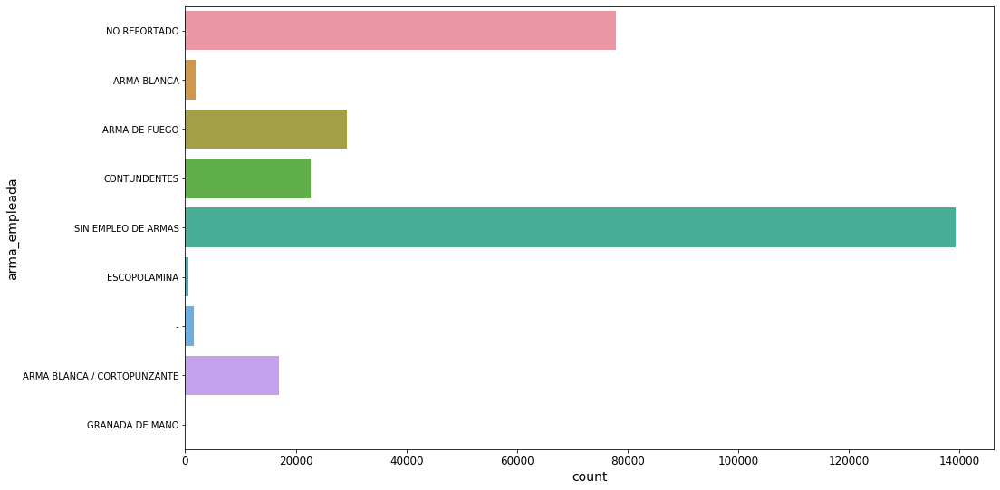

In [54]:
plt.figure(figsize=(16,9))

sns.countplot(
    data=df_f,
    y='arma_empleada',
    orient='h'
)
plt.show()

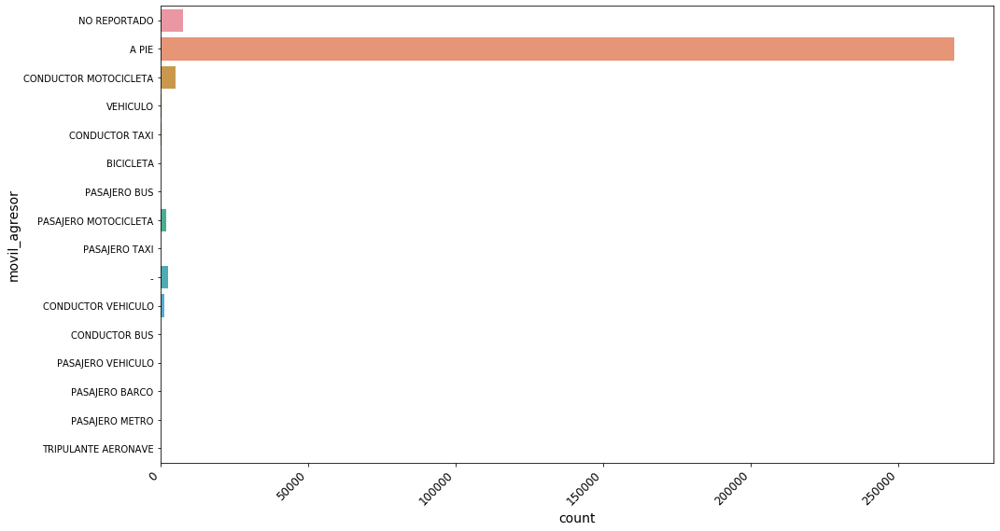

In [57]:
plt.figure(figsize=(16,9))

sns.countplot(
    data=df_f,
    y='movil_agresor',
    orient='h'
) 

plt.xticks(rotation=45, ha='right')
plt.show()

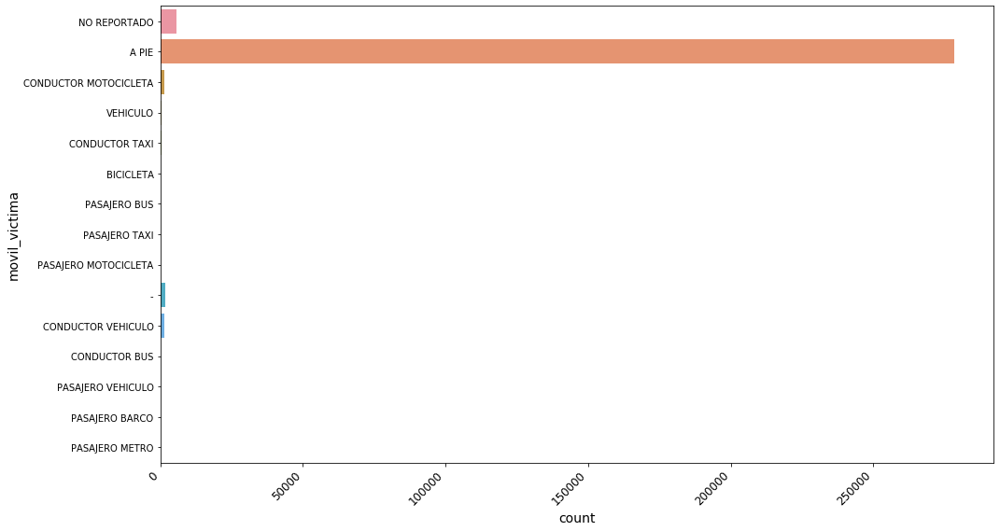

In [58]:
plt.figure(figsize=(16,9))

sns.countplot(
    data=df_f,
    y='movil_victima',
    orient='h'
) 

plt.xticks(rotation=45, ha='right')
plt.show()

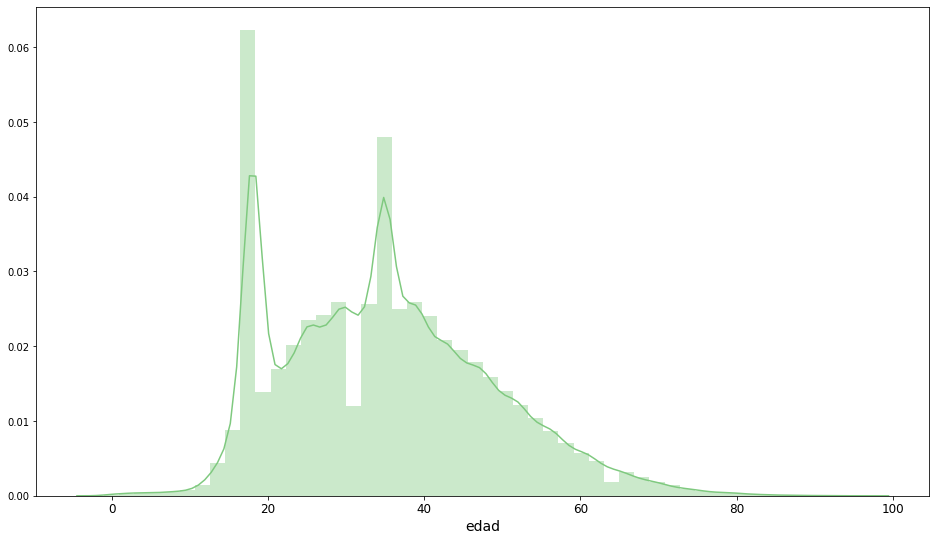

In [63]:
plt.figure(figsize=(16,9))

sns.distplot(
    df_f.edad.replace(["NO REPORTADA","-"], np.nan)
)
plt.show()

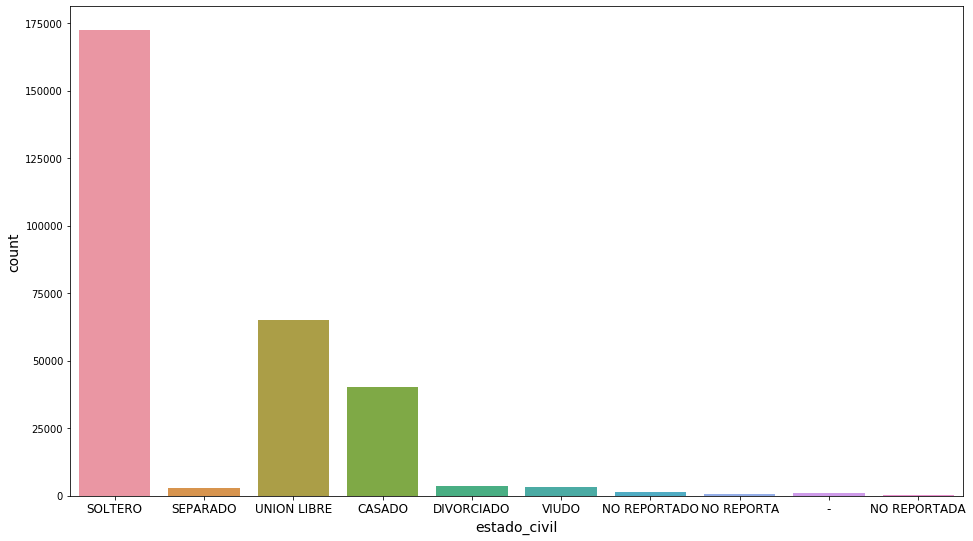

In [64]:
plt.figure(figsize=(16,9))

sns.countplot(
    data=df_f,
    x='estado_civil',
)
plt.show()

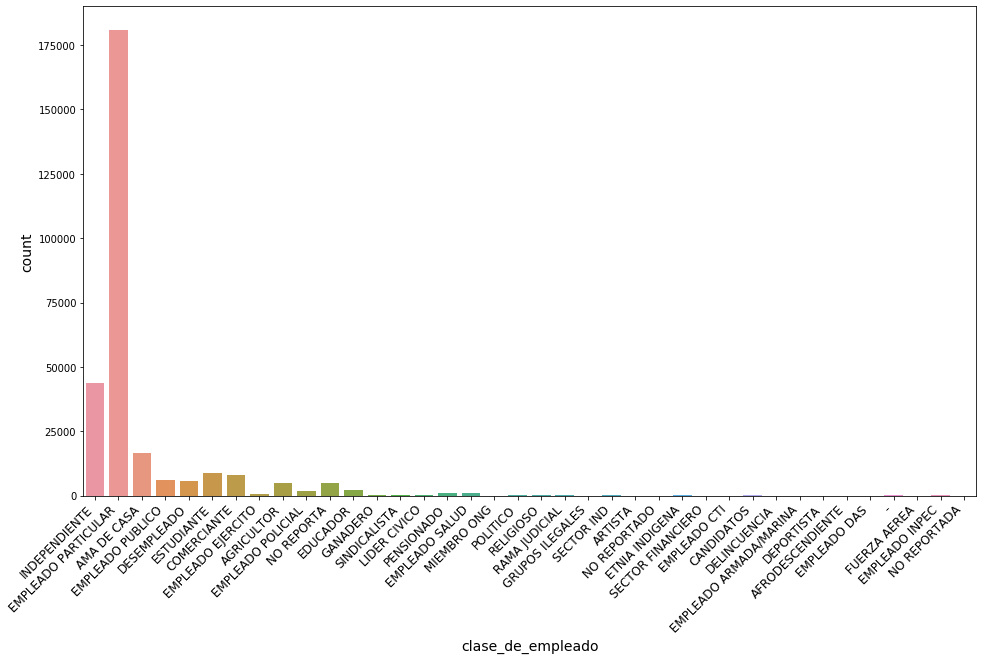

In [65]:
plt.figure(figsize=(16,9))

sns.countplot(
    data=df_f,
    x='clase_de_empleado',
) 

plt.xticks(rotation=45, ha='right')
plt.show()

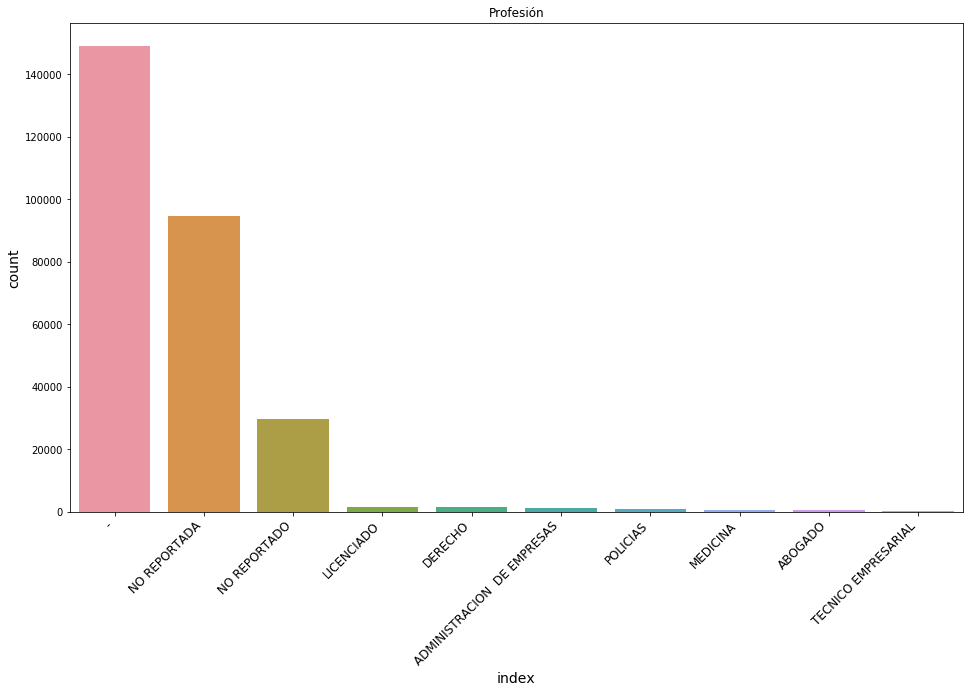

In [67]:
plt.figure(figsize=(16,9))

sns.barplot(
    data=df_f.profesion.value_counts().to_frame('count').reset_index().head(10),
    x='index',
    y='count'
) 
plt.title("Profesión")
plt.xticks(rotation=45, ha='right')
plt.show()

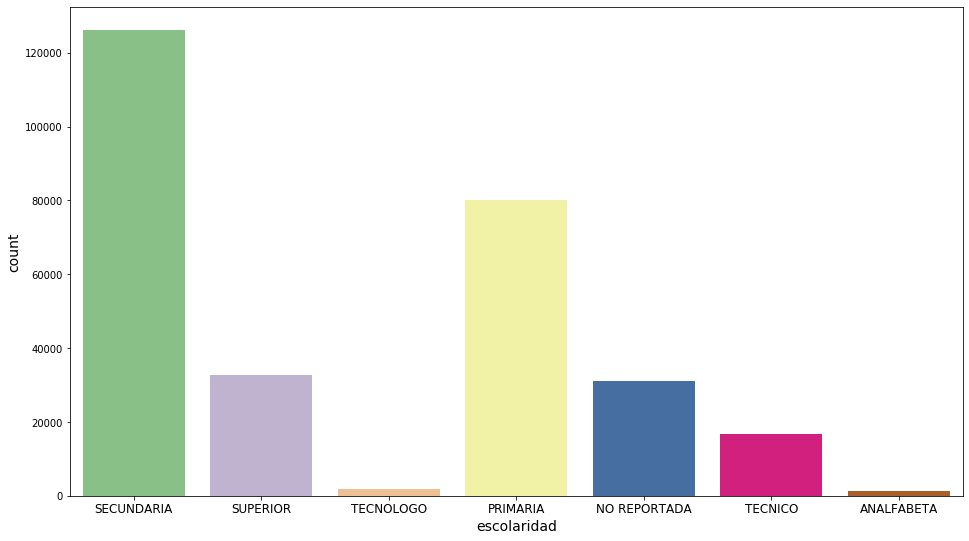

In [68]:
plt.figure(figsize=(16,9))

sns.countplot(
    data=df_f,
    x='escolaridad',
)
plt.show()

In [127]:
#Getting the hours to the same lenght for format

#df_f.hora = df_f.hora.apply(lambda x : str(x)+':00' if len(str(x))<=5 else x)  # else continue)

df_f

,fecha,departamento_,municipio,dia,hora,barrio,zona,clase_de_sitio,arma_empleada,movil_agresor,movil_victima,edad,sexo,estado_civil,pais_de_nacimiento,clase_de_empleado,profesion,escolaridad,codigo_dane,Cantidad
id,,,,,,,,,,,,,,,,,,,,
0,01/01/2010,ANTIOQUIA,MEDELLÍN,Viernes,01:00:00,GRANIZAL C-1,RURAL,CASAS DE HABITACION,NO REPORTADO,NO REPORTADO,NO REPORTADO,48,MASCULINO,SOLTERO,COLOMBIA,INDEPENDIENTE,NO REPORTADO,SECUNDARIA,5001000,1
1,01/01/2010,ANTIOQUIA,MEDELLÍN,Viernes,12:00:00,EL RINCON C-16,URBANA,CASAS DE HABITACION,ARMA BLANCA,A PIE,A PIE,27,MASCULINO,SEPARADO,COLOMBIA,INDEPENDIENTE,NO REPORTADA,SECUNDARIA,5001000,1
2,01/01/2010,ARAUCA,TAME,Viernes,03:30:00,SUCRE,URBANA,VIAS PUBLICAS,NO REPORTADO,CONDUCTOR MOTOCICLETA,CONDUCTOR MOTOCICLETA,25,MASCULINO,SOLTERO,COLOMBIA,EMPLEADO PARTICULAR,NO REPORTADO,SUPERIOR,81794000,1
3,01/01/2010,ARAUCA,TAME,Viernes,06:30:00,CENTRO,URBANA,VIAS PUBLICAS,NO REPORTADO,A PIE,A PIE,37,FEMENINO,UNION LIBRE,COLOMBIA,AMA DE CASA,NO REPORTADO,SECUNDARIA,81794000,1
4,01/01/2010,ATLÁNTICO,BARRANQUILLA,Viernes,16:30:00,LAS MERCEDES,URBANA,DENTRO DE LA VIVIENDA,NO REPORTADO,A PIE,A PIE,31,FEMENINO,CASADO,COLOMBIA,INDEPENDIENTE,FISIOTERAPEUTA,SUPERIOR,8001000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
289959,31/12/2019,SUCRE,SINCELEJO,Martes,0:00:00,LA UNION,URBANA,OTRO,NO REPORTADO,A PIE,A PIE,-,MASCULINO,SOLTERO,-,EMPLEADO PARTICULAR,NO REPORTADA,NO REPORTADA,70001000,1
289960,31/12/2019,SUCRE,SINCELEJO,Martes,20:36:00,LA UNION,URBANA,VIAS PUBLICAS,NO REPORTADO,A PIE,A PIE,34,MASCULINO,SOLTERO,-,EMPLEADO PARTICULAR,NO REPORTADA,SUPERIOR,70001000,1
289961,31/12/2019,TOLIMA,IBAGUÉ,Martes,19:45:00,BALTAZAR,URBANA,VIAS PUBLICAS,NO REPORTADO,A PIE,A PIE,38,MASCULINO,SOLTERO,-,EMPLEADO PARTICULAR,NO REPORTADA,SECUNDARIA,73001000,1


In [129]:
#df_f.hora
#df_f.hora_int = pd.to_datetime(df_f.hora, format='%H:%M:%S').dt.hour
df_f['Year']= pd.to_datetime(df_f.fecha, format='%d/%M/%Y').dt.year
#df_f['year'] = df_f.fecha.dt.year
#df_f['hora_int'] = df_f.hora.dt.hour

In [133]:
df_f['hora_int'] = pd.to_datetime(df_f.hora, format='%H:%M:%S').dt.hour

In [135]:
df_f.sexo

id
0         MASCULINO
1         MASCULINO
2         MASCULINO
3          FEMENINO
4          FEMENINO
            ...    
289959    MASCULINO
289960    MASCULINO
289961    MASCULINO
289962    MASCULINO
289963    MASCULINO
Name: sexo, Length: 289964, dtype: object

In [141]:
df_f[df_f.sexo.isin(["MASCULINO","FEMENINO"])]

,fecha,departamento_,municipio,dia,hora,barrio,zona,clase_de_sitio,arma_empleada,movil_agresor,...,sexo,estado_civil,pais_de_nacimiento,clase_de_empleado,profesion,escolaridad,codigo_dane,Cantidad,Year,hora_int
id,,,,,,,,,,,,,,,,,,,,,
0,01/01/2010,ANTIOQUIA,MEDELLÍN,Viernes,01:00:00,GRANIZAL C-1,RURAL,CASAS DE HABITACION,NO REPORTADO,NO REPORTADO,...,MASCULINO,SOLTERO,COLOMBIA,INDEPENDIENTE,NO REPORTADO,SECUNDARIA,5001000,1,2010,1
1,01/01/2010,ANTIOQUIA,MEDELLÍN,Viernes,12:00:00,EL RINCON C-16,URBANA,CASAS DE HABITACION,ARMA BLANCA,A PIE,...,MASCULINO,SEPARADO,COLOMBIA,INDEPENDIENTE,NO REPORTADA,SECUNDARIA,5001000,1,2010,12
2,01/01/2010,ARAUCA,TAME,Viernes,03:30:00,SUCRE,URBANA,VIAS PUBLICAS,NO REPORTADO,CONDUCTOR MOTOCICLETA,...,MASCULINO,SOLTERO,COLOMBIA,EMPLEADO PARTICULAR,NO REPORTADO,SUPERIOR,81794000,1,2010,3
3,01/01/2010,ARAUCA,TAME,Viernes,06:30:00,CENTRO,URBANA,VIAS PUBLICAS,NO REPORTADO,A PIE,...,FEMENINO,UNION LIBRE,COLOMBIA,AMA DE CASA,NO REPORTADO,SECUNDARIA,81794000,1,2010,6
4,01/01/2010,ATLÁNTICO,BARRANQUILLA,Viernes,16:30:00,LAS MERCEDES,URBANA,DENTRO DE LA VIVIENDA,NO REPORTADO,A PIE,...,FEMENINO,CASADO,COLOMBIA,INDEPENDIENTE,FISIOTERAPEUTA,SUPERIOR,8001000,1,2010,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
289959,31/12/2019,SUCRE,SINCELEJO,Martes,0:00:00,LA UNION,URBANA,OTRO,NO REPORTADO,A PIE,...,MASCULINO,SOLTERO,-,EMPLEADO PARTICULAR,NO REPORTADA,NO REPORTADA,70001000,1,2019,0
289960,31/12/2019,SUCRE,SINCELEJO,Martes,20:36:00,LA UNION,URBANA,VIAS PUBLICAS,NO REPORTADO,A PIE,...,MASCULINO,SOLTERO,-,EMPLEADO PARTICULAR,NO REPORTADA,SUPERIOR,70001000,1,2019,20
289961,31/12/2019,TOLIMA,IBAGUÉ,Martes,19:45:00,BALTAZAR,URBANA,VIAS PUBLICAS,NO REPORTADO,A PIE,...,MASCULINO,SOLTERO,-,EMPLEADO PARTICULAR,NO REPORTADA,SECUNDARIA,73001000,1,2019,19


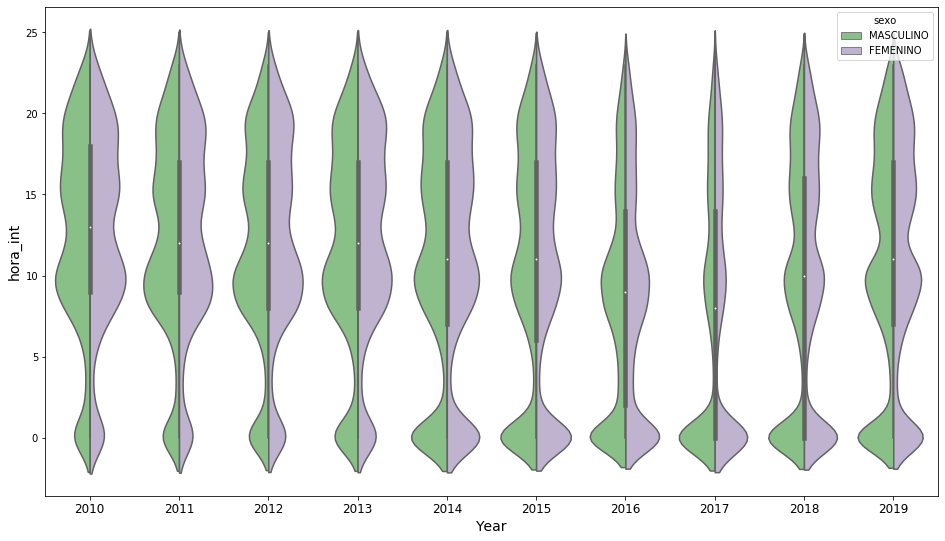

In [142]:
sns.set_palette('Set1')
fig, ax = plt.subplots(figsize=(16,9))
sns.violinplot(
    data=df_f[df_f.sexo.isin(["MASCULINO","FEMENINO"])],
    x='Year',
    y='hora_int',
    hue='sexo',
    ax=ax,
    split=True,
    palette="Accent"
);

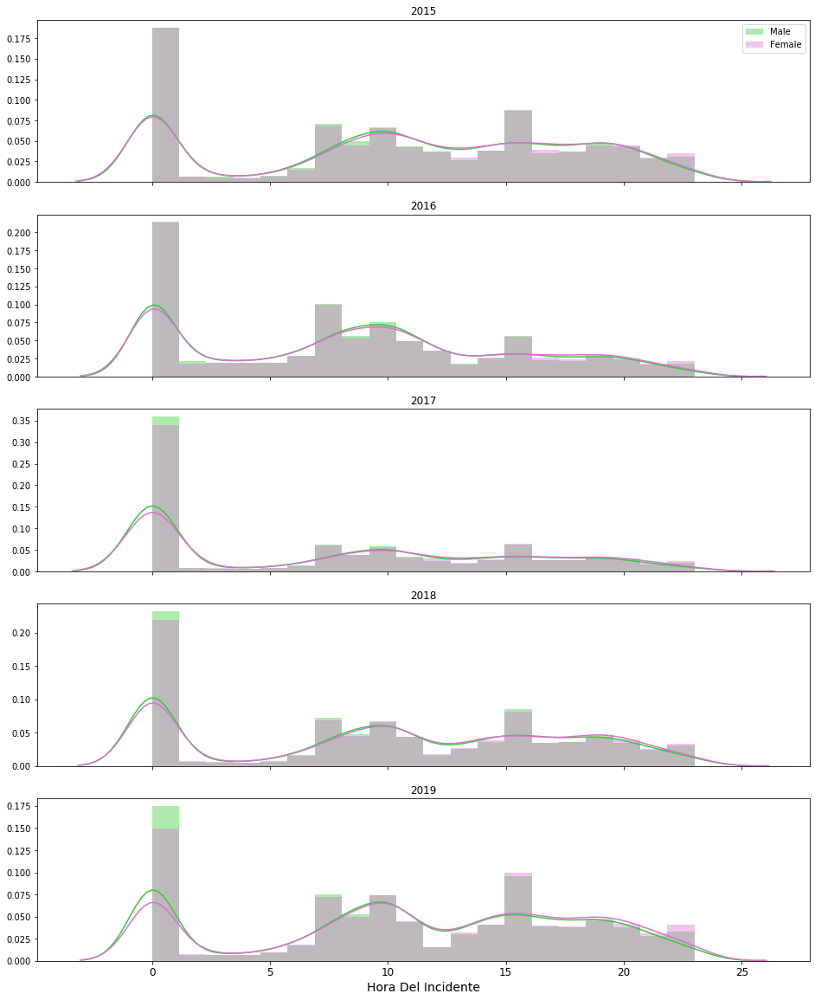

In [143]:
fig, ax = plt.subplots(5, 1, figsize=(16,20), sharex=True)
i=0
for year in np.arange(2015,2020):
    sns.distplot(
        df_f.loc[((df_f.sexo == 'MASCULINO') & (df_f.Year == year)), 'hora_int'],
        bins=20,
        color='limegreen',
        label='Male',
        ax=ax[i]
    )

    sns.distplot(
        df_f.loc[((df_f.sexo == 'FEMENINO') & (df_f.Year == year)), 'hora_int'],
        bins=20,
        color='orchid',
        label='Female',
        ax=ax[i]
    )
    ax[i].set_title(str(year))
    ax[i].set_xlabel('')
    i+=1

ax[0].legend()
ax[-1].set_xlabel('Hora Del Incidente');

In [144]:
import json

with open('./data/geoJson_departamentos.json', 'r') as f:
    departamentos = json.load(f)
    
areas = pd.read_json('./data/areas_departamentos.json',
                     orient='index')
# with open('./data/geoJson_departamentos.json', 'w') as f:
#     json.dump(departamentos, f)

# with open('./data/areas_departamentos.json', 'w') as f:
#     json.dump(areas, f)

## Maps of counts

In [145]:
import plotly.express as px

In [153]:
df_f.rename(columns={"departamento_":"departamento"}, inplace=True)
df_f

,fecha,departamento,municipio,dia,hora,barrio,zona,clase_de_sitio,arma_empleada,movil_agresor,...,sexo,estado_civil,pais_de_nacimiento,clase_de_empleado,profesion,escolaridad,codigo_dane,Cantidad,Year,hora_int
id,,,,,,,,,,,,,,,,,,,,,
0,01/01/2010,ANTIOQUIA,MEDELLÍN,Viernes,01:00:00,GRANIZAL C-1,RURAL,CASAS DE HABITACION,NO REPORTADO,NO REPORTADO,...,MASCULINO,SOLTERO,COLOMBIA,INDEPENDIENTE,NO REPORTADO,SECUNDARIA,5001000,1,2010,1
1,01/01/2010,ANTIOQUIA,MEDELLÍN,Viernes,12:00:00,EL RINCON C-16,URBANA,CASAS DE HABITACION,ARMA BLANCA,A PIE,...,MASCULINO,SEPARADO,COLOMBIA,INDEPENDIENTE,NO REPORTADA,SECUNDARIA,5001000,1,2010,12
2,01/01/2010,ARAUCA,TAME,Viernes,03:30:00,SUCRE,URBANA,VIAS PUBLICAS,NO REPORTADO,CONDUCTOR MOTOCICLETA,...,MASCULINO,SOLTERO,COLOMBIA,EMPLEADO PARTICULAR,NO REPORTADO,SUPERIOR,81794000,1,2010,3
3,01/01/2010,ARAUCA,TAME,Viernes,06:30:00,CENTRO,URBANA,VIAS PUBLICAS,NO REPORTADO,A PIE,...,FEMENINO,UNION LIBRE,COLOMBIA,AMA DE CASA,NO REPORTADO,SECUNDARIA,81794000,1,2010,6
4,01/01/2010,ATLÁNTICO,BARRANQUILLA,Viernes,16:30:00,LAS MERCEDES,URBANA,DENTRO DE LA VIVIENDA,NO REPORTADO,A PIE,...,FEMENINO,CASADO,COLOMBIA,INDEPENDIENTE,FISIOTERAPEUTA,SUPERIOR,8001000,1,2010,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
289959,31/12/2019,SUCRE,SINCELEJO,Martes,0:00:00,LA UNION,URBANA,OTRO,NO REPORTADO,A PIE,...,MASCULINO,SOLTERO,-,EMPLEADO PARTICULAR,NO REPORTADA,NO REPORTADA,70001000,1,2019,0
289960,31/12/2019,SUCRE,SINCELEJO,Martes,20:36:00,LA UNION,URBANA,VIAS PUBLICAS,NO REPORTADO,A PIE,...,MASCULINO,SOLTERO,-,EMPLEADO PARTICULAR,NO REPORTADA,SUPERIOR,70001000,1,2019,20
289961,31/12/2019,TOLIMA,IBAGUÉ,Martes,19:45:00,BALTAZAR,URBANA,VIAS PUBLICAS,NO REPORTADO,A PIE,...,MASCULINO,SOLTERO,-,EMPLEADO PARTICULAR,NO REPORTADA,SECUNDARIA,73001000,1,2019,19


In [155]:
df_f.departamento = np.where(df_f.departamento == "GUAJIRA", "LA GUAJIRA", df_f.departamento)
df_f.departamento = np.where(df_f.municipio == "BOGOTÁ D.C.", "BOGOTA D.C.", df_f.departamento)
df_f.departamento = np.where(df_f.departamento == "VALLE", "VALLE DEL CAUCA", df_f.departamento)

In [164]:
count_2019 = df_f[df_f.Year == 2015].departamento.value_counts().reset_index(name='count')
fig = px.choropleth_mapbox(
    count_2019,
    geojson=departamentos,
    locations='index',
    color='count',
    color_continuous_scale="Viridis",
    mapbox_style="carto-positron",
    zoom=4,
    center = {"lat": 3.47, "lon": -73.96},
    opacity=0.5
)

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [165]:
count_2019_per_area = df_f[df_f.Year == 2019].departamento\
    .value_counts()\
    .reset_index(name='count')\
    .rename(columns={'index':'dept'})

count_2019_per_area = count_2019_per_area.merge(areas, left_on='dept', right_index=True)
count_2019_per_area['values'] = count_2019_per_area.eval('count/area')


fig = px.choropleth_mapbox(
    count_2019_per_area,
    geojson=departamentos,
    locations='dept',
    color='values',
    color_continuous_scale="Viridis",
    mapbox_style="carto-positron",
    zoom=4,
    center = {"lat": 3.47, "lon": -73.96},
    opacity=0.5
)

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()